# Computational Social Science Project #2 
Group members: Vincent Chen, Lawrence Liu, & Kelly Quinn 

Date: 10/20/2020

# 1. Set Up

In [213]:
## import necessary packages
import pandas as pd
from pandas.plotting import scatter_matrix
import numpy as np
from sklearn.preprocessing import OneHotEncoder, scale
import matplotlib.pyplot as plt
from matplotlib import rc
import plotly.graph_objects as go
import nbformat
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, ElasticNetCV
from sklearn.metrics import mean_squared_error
import seaborn as sns
from sklearn.model_selection import KFold, GridSearchCV, RandomizedSearchCV
from sklearn.exceptions import ConvergenceWarning
from sklearn.ensemble import RandomForestRegressor
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import RFE
from sklearn.metrics import r2_score
import math
from sklearn.model_selection import cross_val_score


# use random seed for consistent results 
import random
random.seed(273)

# 2. Exploratory Data Analysis

In [214]:
##Cleaning for Exploratory Data Analysis

diabetes_filename = 'Diabetes with Population Info by County 2017.csv'
df = pd.read_csv(diabetes_filename, dtype={"CountyFIPS": str}) #CountyFips needs to be a string so leading 0 isn't dropped

df = df[df.Diabetes_Number != "Suppressed"] #drop row with "Suppressed" value in Diabetes_Number
df["Diabetes_Number"] = df["Diabetes_Number"].astype('int64') #convert Diabetes Number to int
df['Rate_Per_Thousand'] = df['Diabetes_Number']*1000

#df["Diabetes_Number_PC"] = df["Diabetes_Number"] / df["race_total population"] #create diabetes number per capita column

df = df[df["Obesity_Number"] != 'No Data']
df = df[df['Physical_Inactivity_Number'] != "No Data"]

df = df.dropna()

target_col = 'sex and age_total population_65 years and over_sex ratio (males per 100 females)'
df = df[df[target_col] != '-']

##Remove duplicate columns

## Identify more duplicate columns - source: https://thispointer.com/how-to-find-drop-duplicate-columns-in-a-dataframe-python-pandas/ - kq
def getDuplicateColumns(df):
    '''
    Get a list of duplicate columns.
    It will iterate over all the columns in dataframe and find the columns whose contents are duplicate.
    :param df: Dataframe object
    :return: List of columns whose contents are duplicates.
    '''
    duplicateColumnNames = set()
    # Iterate over all the columns in dataframe
    for x in range(df.shape[1]):
        # Select column at xth index.
        col = df.iloc[:, x]
        # Iterate over all the columns in DataFrame from (x+1)th index till end
        for y in range(x + 1, df.shape[1]):
            # Select column at yth index.
            otherCol = df.iloc[:, y]
            # Check if two columns at x 7 y index are equal
            if col.equals(otherCol):
                duplicateColumnNames.add(df.columns.values[y])
    return list(duplicateColumnNames)

duplicateColumnNames = getDuplicateColumns(df)
print('Duplicate Columns are as follows')
for col in duplicateColumnNames:
    print('Column name : ', col)

#drop all duplicated columns
df = df.drop(columns=['race_total population_one race_1', 'race_total population_two or more races_1',
                     'sex and age_total population_18 years and over_1', 
                      'sex and age_total population_65 years and over_1',
                      'sex and age_total population', 
                      'race alone or in combination with one or more other races_total population',
                      'hispanic or latino and race_total population'
                     ]) 

#drop ratio + median columns
df = df.drop(columns = ['sex and age_total population_65 years and over_sex ratio (males per 100 females)', 
                       'sex and age_total population_18 years and over_sex ratio (males per 100 females)', 
                       'sex and age_total population_median age (years)']) 

df.shape # 3112*86

Duplicate Columns are as follows
Column name :  sex and age_total population
Column name :  sex and age_total population_65 years and over_1
Column name :  hispanic or latino and race_total population
Column name :  race_total population_one race_1
Column name :  sex and age_total population_18 years and over_1
Column name :  race alone or in combination with one or more other races_total population
Column name :  race_total population_two or more races_1


(3112, 86)

#### First, we convert existing counts to percentages to calculate rates:

In [215]:
# select count variables to rc to percentages
rc_cols = [col for col in df.columns if col not in ['County', 'State', 'CountyFIPS']]
           
           
df[rc_cols] = df[rc_cols].apply(pd.to_numeric, errors='coerce') # recode to numeric

# divide all columns but those listed above by total population 
df[rc_cols] = df[rc_cols].div(df['race_total population'], axis=0)


In [216]:
# check work: all rates are bounded by 0 and 1 as expected
pd.set_option('display.max_columns', None)
df_summary = df.describe().transpose()

with pd.option_context('display.max_rows', 100, 'display.max_columns', None): 
    display(df_summary.iloc[ : ,[0,1,3,7]])

,count,mean,min,max
Diabetes_Number,3112.0,0.092857,0.019038,0.224208
Obesity_Number,3112.0,0.251666,0.088946,0.476788
Physical_Inactivity_Number,3112.0,0.200861,0.064949,0.392285
race_total population,3112.0,1.000000,1.000000,1.000000
race_total population_one race,3112.0,0.976059,0.713126,1.000000
race_total population_two or more races,3112.0,0.023941,0.000000,0.286874
race_total population_one race_white,3112.0,0.831107,0.038912,1.000000
race_total population_one race_black or african american,3112.0,0.090215,0.000000,0.874123
race_total population_one race_american indian and alaska native,3112.0,0.019398,0.000000,0.924799
race_total population_one race_american indian and alaska native_cherokee tribal grouping,3112.0,0.001791,0.000000,0.409669


## (i) Choropleth Map: Diabates Number by County

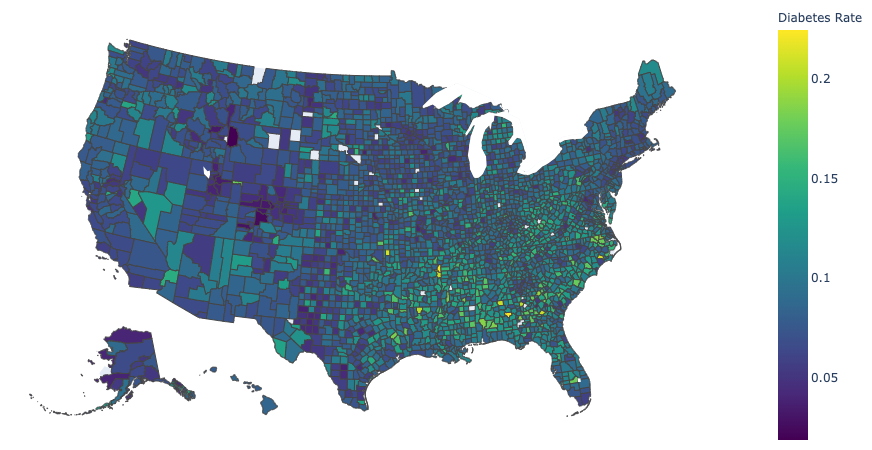

In [217]:
# Documentation relied upon at: https://plotly.com/python/choropleth-maps/

from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)
    
from plotly import express as px

df_choro = df[['CountyFIPS', 'Diabetes_Number']] #make dataframe with two columns to speed up process

fig = px.choropleth(df_choro, geojson=counties, locations='CountyFIPS', color='Diabetes_Number',
                           color_continuous_scale="Viridis", 
                           scope="usa",
                           labels={'Diabetes_Number':'Diabetes Rate'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

The choropleth map illustrates how diabetes rates are distributed across the country. We notice that  diabetes rates in some counties are above 20% of the county population. We also see that the counties with the highest diabetes rates tend to be concentrated in the Southeastern United States.

## (ii) Correlation Plot

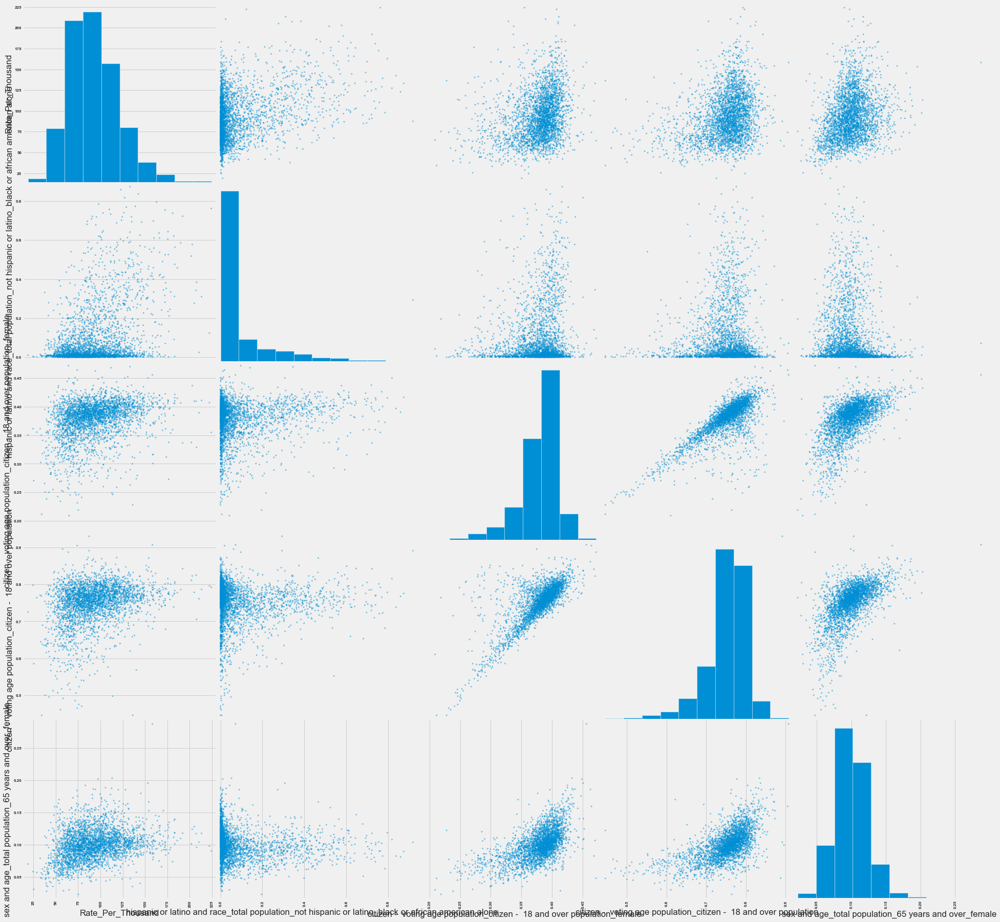

In [218]:
### EDA: get correlation with Diabetes_Number
corr_w_diab_num = df.corr()['Diabetes_Number']
cols = corr_w_diab_num.axes[0].to_list()
col2corr = {col:corr_w_diab_num[col] for col in cols}
col_corr = sorted(col2corr.items(), key=lambda x: x[1])
top_correlated_cols = [p[0] for p in col_corr[-5:][::-1]]
scatter_matrix(df[top_correlated_cols], figsize=(30, 30)); # adding a semi colon hides the code - kq


# INSERT EXPLANATION OF CORRELATION PLOT HERE!

## (iii) Diabetes Rates by Subgroup Distribution

### (iiia) Diabetes Rate by County Age Breakdown 

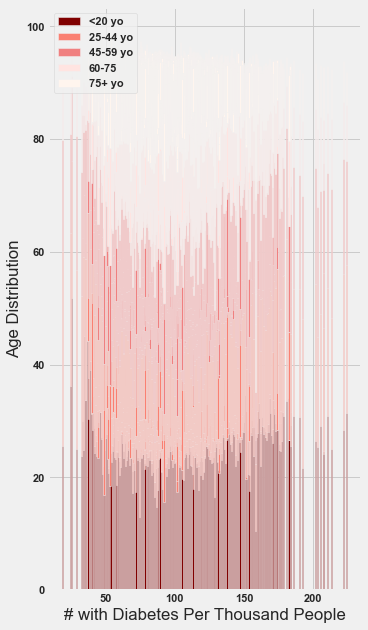

In [219]:
rc('font', weight='bold')

bar_u25 = df['sex and age_total population_under 5 years']*100 + df['sex and age_total population_5 to 9 years']*100 + df['sex and age_total population_10 to 14 years']*100 + df['sex and age_total population_15 to 19 years'] * 100 + df['sex and age_total population_20 to 24 years']*100 
bar_2544 = df['sex and age_total population_25 to 34 years']*100 + df['sex and age_total population_35 to 44 years']*100
bar_4559 = df['sex and age_total population_45 to 54 years']*100 + df['sex and age_total population_55 to 59 years']*100 
bar_6075 = df['sex and age_total population_60 to 64 years'] + df['sex and age_total population_65 to 74 years']*100 
bar_o75 = df['sex and age_total population_75 to 84 years']*100 + df['sex and age_total population_85 years and over']*100 

# cumulative height of bars
barx1 = np.add(bar_u25,bar_2544).tolist() # first two bars
barx2 = np.add(barx1,bar_4559).tolist() # first three bars
barx3 = np.add(barx2,bar_6075).tolist() # first four bars

p1 = plt.bar(df['Rate_Per_Thousand'],bar_u25, color='maroon')
p2 = plt.bar(df['Rate_Per_Thousand'],bar_2544, bottom=bar_u25, color='salmon')
p3 = plt.bar(df['Rate_Per_Thousand'],bar_4559, bottom=barx1, color='lightcoral')
p4 = plt.bar(df['Rate_Per_Thousand'],bar_6075, bottom=barx2, color='mistyrose')
p5 = plt.bar(df['Rate_Per_Thousand'],bar_o75, bottom=barx3, color='seashell')


plt.xlabel("# with Diabetes Per Thousand People")
plt.ylabel("Age Distribution")
plt.legend((p1[0],p2[0],p3[0],p4[4],p5[0]), ("<20 yo", "25-44 yo", "45-59 yo", "60-75", '75+ yo'),loc="upper left")

plt.show()

### (iiib) Diabetes Rate by Race Breakdown 

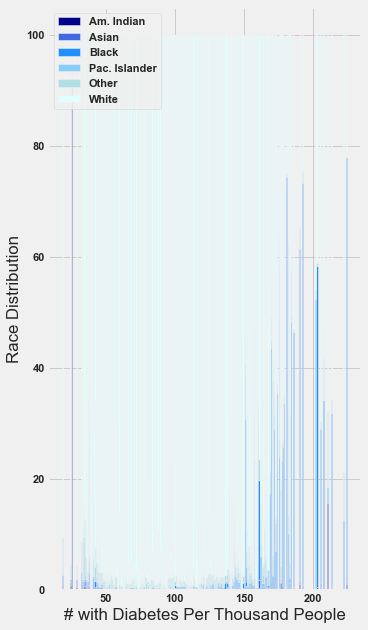

In [220]:
bar_amin = df['race_total population_one race_american indian and alaska native'] * 100 
bar_asian = df['race_total population_one race_asian'] *100
bar_blk = df['race_total population_one race_black or african american'] * 100 
bar_pacisl = df['race_total population_one race_native hawaiian and other pacific islander'] *100
bar_other = df['race_total population_one race_some other race'] *100 + df['race_total population_two or more races'] * 100 
bar_white = df['race_total population_one race_white'] *100

# cumulative height of bars 
barx1 = np.add(bar_amin,bar_asian).tolist() 
barx2 = np.add(barx1,bar_blk).tolist()
barx3 = np.add(barx2,bar_pacisl).tolist() 
barx4 = np.add(barx3,bar_other).tolist() 

p1 = plt.bar(df['Rate_Per_Thousand'],bar_amin, color='darkblue')
p2 = plt.bar(df['Rate_Per_Thousand'],bar_asian, bottom=bar_amin, color='royalblue')
p3 = plt.bar(df['Rate_Per_Thousand'],bar_blk, bottom=barx1, color='dodgerblue')
p4 = plt.bar(df['Rate_Per_Thousand'],bar_pacisl, bottom=barx2, color='lightskyblue')
p5 = plt.bar(df['Rate_Per_Thousand'],bar_other, bottom=barx3, color='powderblue')
p6 = plt.bar(df['Rate_Per_Thousand'],bar_white, bottom=barx4, color='lightcyan')


plt.xlabel("# with Diabetes Per Thousand People")
plt.ylabel("Race Distribution")
plt.legend((p1[0],p2[0],p3[0],p4[4],p5[0],p6[0]), ("Am. Indian", "Asian", "Black", "Pac. Islander", "Other", "White"),loc="upper left")

plt.show()

## INSERT EXPLANATION OF SUBGROUP DISTRIBUTIONS HERE. CONSIDER SWAPPING W/ THE CORRELATION PLOT SO ORDER WOULD BE CHOROPLETH, SUBGROUP DISTROS, CORRELATION PLOT?

# 3. Preparing to Fit Models

### 3.1. Clean Data

In [221]:
##Feature Selection

#Convert state to dummy variables
onehotencoder = OneHotEncoder()
onehotencoder.fit(df['State'].to_numpy().reshape(-1, 1))
state_array = onehotencoder.transform(df['State'].to_numpy().reshape(-1, 1)).todense()

df_states = pd.DataFrame(state_array)
df_wo_states = df.drop(columns=['State'])
df_cleaned = pd.concat([df_states, df_wo_states], axis=1)

#Drop County and FIPS
df_cleaned.drop(columns=['County', 'CountyFIPS'])

#Drop rate per thosuand feature created for EDA.
df_cleaned = df.drop(columns = "Rate_Per_Thousand")

#Select variable that have correlations above 0.3 with Diabetes_Number
cor = df_cleaned.corr()
cor_target = abs(cor["Diabetes_Number"])

relevant_features = cor_target[cor_target>0.3]
relevant_features

Diabetes_Number                                                                                         1.000000
Obesity_Number                                                                                          0.549577
Physical_Inactivity_Number                                                                              0.591118
race_total population_one race_black or african american                                                0.369464
race alone or in combination with one or more other races_total population_black or african american    0.365546
hispanic or latino and race_total population_not hispanic or latino_black or african american alone     0.371810
Name: Diabetes_Number, dtype: float64

We are interested in only keeping the features that are highly correlated with our target of interest: diabetes rate. Features that are not highly correlated with the target do not provide enough information to improve our prediction, and keeping such features would hinder interpretability and be computationally expensive.

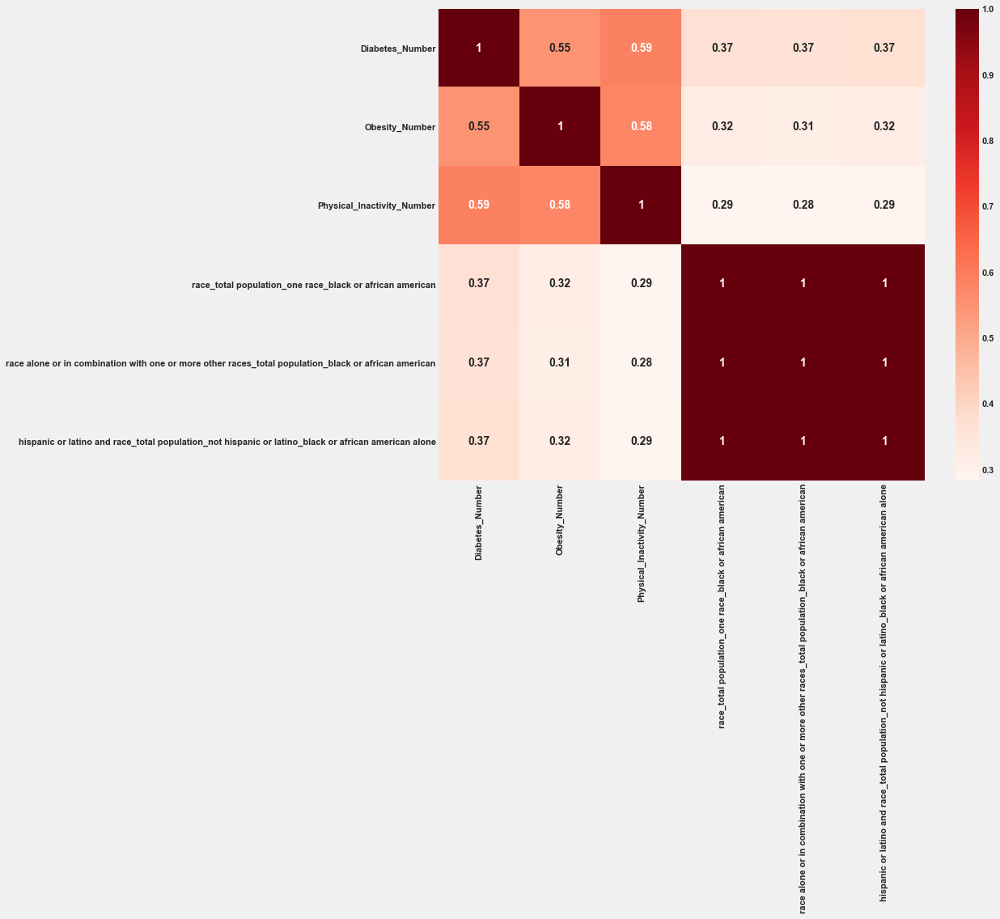

In [222]:
#Recreate data frame, only keeping features that are highly correalted with target

df_cleaned = df_cleaned.filter(['Diabetes_Number', 'Obesity_Number', 'Physical_Inactivity_Number',
                                        'race_total population_one race_black or african american', 
                                        'race alone or in combination with one or more other races_total population_black or african american',
                                        'hispanic or latino and race_total population_not hispanic or latino_black or african american alone'])

plt.figure(figsize=(12,10))
cor = df_cleaned.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

Since 'race_total population_one race_black or african american', 'race alone or in combination with one or more other races_total population_black or african american', and 'hispanic or latino and race_total population_not hispanic or latino_black or african american alone' are perfectly correlated with each other (corr = 1), we select the feature that has the strongest correlation with the target: 'hispanic or latino and race_total population_not hispanic or latino_black or african american alone."

In [223]:
df_cleaned = df_cleaned.drop(columns = ['race_total population_one race_black or african american',
                               'race alone or in combination with one or more other races_total population_black or african american'])

In [224]:
#Convert observations to floats
for col in df_cleaned.columns:
    df_cleaned[col] = df_cleaned[col].astype('float64')

print("Shape of Cleaned DataFrame:", df.shape)
df_cleaned.head()

Shape of Cleaned DataFrame: (3112, 86)


,Diabetes_Number,Obesity_Number,Physical_Inactivity_Number,hispanic or latino and race_total population_not hispanic or latino_black or african american alone
0,0.093804,0.244366,0.226902,0.189764
1,0.080281,0.233255,0.192324,0.093841
2,0.131875,0.310643,0.210651,0.473160
3,0.105251,0.290052,0.258667,0.220802
4,0.108977,0.246804,0.249198,0.014225


### 3.2. Partition Data

In [225]:
##Splititng into features and target
features = df_cleaned.drop(columns = ["Diabetes_Number"])
target = df_cleaned.filter(["Diabetes_Number"])

## Data partition
n_data = df_cleaned.shape[0]
n_train = int(n_data*0.7)
n_valid = int(n_data*0.2)
n_test = n_data - n_train - n_valid

labels = np.repeat(['train', 'valid', 'test'], (n_train, n_valid, n_test))
np.random.seed(0)
randomized_labels = np.random.choice(labels, n_data, replace=False)
df_cleaned['group'] = randomized_labels

df_train = df_cleaned[df_cleaned['group'] == 'train']
df_valid = df_cleaned[df_cleaned['group'] == 'valid']
df_test = df_cleaned[df_cleaned['group'] == 'test']

df_train = df_train.drop(columns=['group'])
df_valid = df_valid.drop(columns=['group'])
df_test = df_test.drop(columns=['group'])

y_train = df_train['Diabetes_Number']
X_train = df_train.drop(columns=['Diabetes_Number'])
y_valid = df_valid['Diabetes_Number']
X_valid = df_valid.drop(columns=['Diabetes_Number'])
X_test = df_test.drop(columns=['Diabetes_Number'])
y_test = df_test['Diabetes_Number']

#standardize features
X_train_scaled = scale(X_train)
X_valid_scaled = scale(X_valid)
X_test_scaled = scale(X_test)

In [226]:
features_scaled = scale(features)

### 3.3. Feature Selection

Above in Section 3.1, we remove state and county identifiers, as well as an exact multiple of the diabetes rate created in the EDA process. Below, we drop additional features as a result of collinearity. 

# 4. Train Models, Predict on Validation Set, Refine Models

## (i) OLS Regression Model

In [227]:
#Determine hyperparameters to use
param_grid = {'fit_intercept': ['True', 'False'],
              'normalize': ['True', 'False']}

lin_grid_reg = GridSearchCV(LinearRegression(), param_grid, cv=3, iid=False)
lin_grid_reg.fit(X_train_scaled, y_train)

best_index = np.argmax(lin_grid_reg.cv_results_["mean_test_score"])

print(lin_grid_reg.cv_results_["params"][best_index])

{'fit_intercept': 'True', 'normalize': 'True'}


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:847: FutureWarning:

The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.



In [228]:
#Fit linear regression model on  training data using best hyperparameters
linear_reg = LinearRegression(**lin_grid_reg.cv_results_["params"][best_index]).fit(X_train_scaled, y_train)


R^2 of OLS Training Model: 0.42431355200326104
Correlation of OLS Training Model: 0.6513935461786992


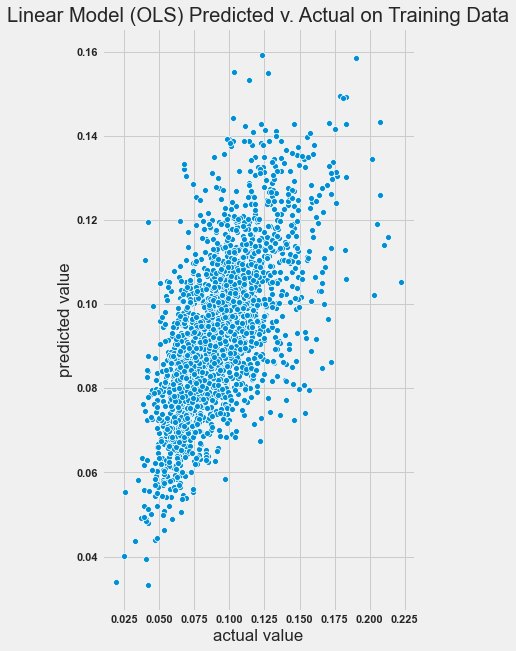

In [229]:
# Evaluate how well model fits the training data
lin_y_hat_train = linear_reg.predict(X_train_scaled)
lin_r2_score =  r2_score(y_train, lin_y_hat_train)
print("R^2 of OLS Training Model:", lin_r2_score)
print("Correlation of OLS Training Model:", math.sqrt(lin_r2_score))

sns.scatterplot(y_train, lin_y_hat_train)
plt.title('Linear Model (OLS) Predicted v. Actual on Training Data')
plt.xlabel('actual value')
plt.ylabel('predicted value')
plt.show()

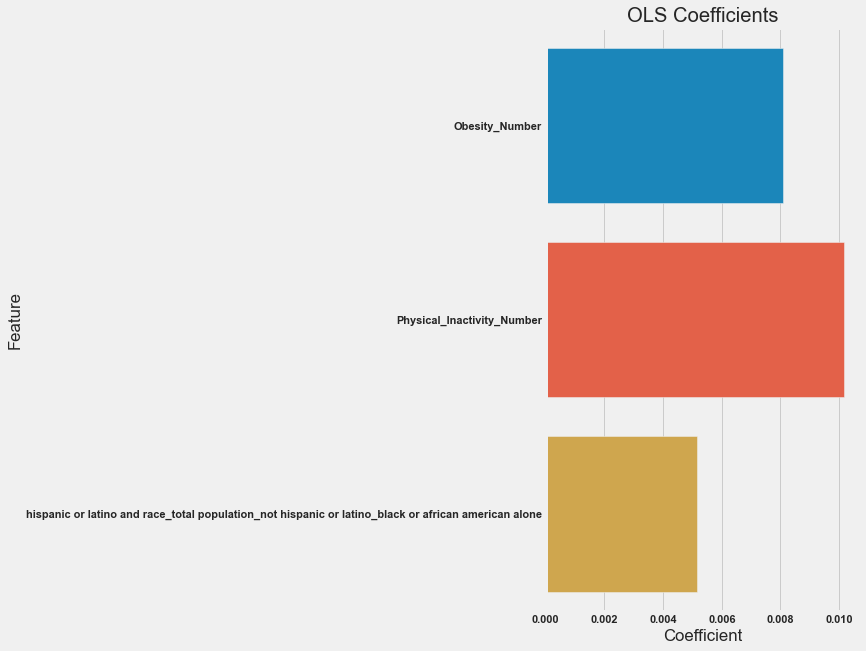

In [230]:
# Create a dataframe with the coefficient and feature names
lin_reg_data = pd.DataFrame([linear_reg.coef_, X_train.columns]).T
lin_reg_data.columns = ['Coefficient', 'Feature']
# Plot
ax = sns.barplot(x="Coefficient", y="Feature", data=lin_reg_data)
ax.set_title("OLS Coefficients")
plt.show()

## (ii) Ridge Regression Model

In [231]:
#Determine hyperparameters to use for ridge
param_grid = {'alpha': np.arange(.1, 1, .1),
               'normalize': ['True', 'False'],
             'fit_intercept': ['True', 'False'],
             'solver': ['auto', 'svd', 'cholesky', 'lsqr']}

ridge_grid_reg = GridSearchCV(Ridge(), param_grid, cv=3, iid=False)
ridge_grid_reg.fit(X_train_scaled, y_train)

print(ridge_grid_reg.cv_results_["params"][best_index])



{'alpha': 0.1, 'fit_intercept': 'True', 'normalize': 'True', 'solver': 'auto'}


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:847: FutureWarning:

The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.



In [232]:
#Fit ridge regression model on  training data using best hyperparameters
ridge_reg = Ridge(**ridge_grid_reg.cv_results_["params"][best_index]).fit(X_train_scaled, y_train)

R^2 of Ridge Training Model: 0.42304390959393234
Correlation of Ridge Training Model 0.6504182574266595


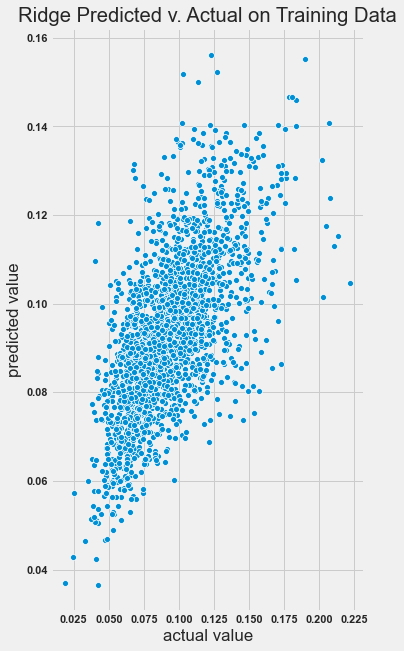

In [233]:
# Evaluate how well model fits the training data
ridge_y_hat_train = ridge_reg.predict(X_train_scaled)
ridge_r2_score = r2_score(y_train, ridge_y_hat_train)
print("R^2 of Ridge Training Model:", ridge_r2_score)
print("Correlation of Ridge Training Model", math.sqrt(ridge_r2_score))

sns.scatterplot(y_train, ridge_y_hat_train)
plt.title('Ridge Predicted v. Actual on Training Data')
plt.xlabel('actual value')
plt.ylabel('predicted value')
plt.show()

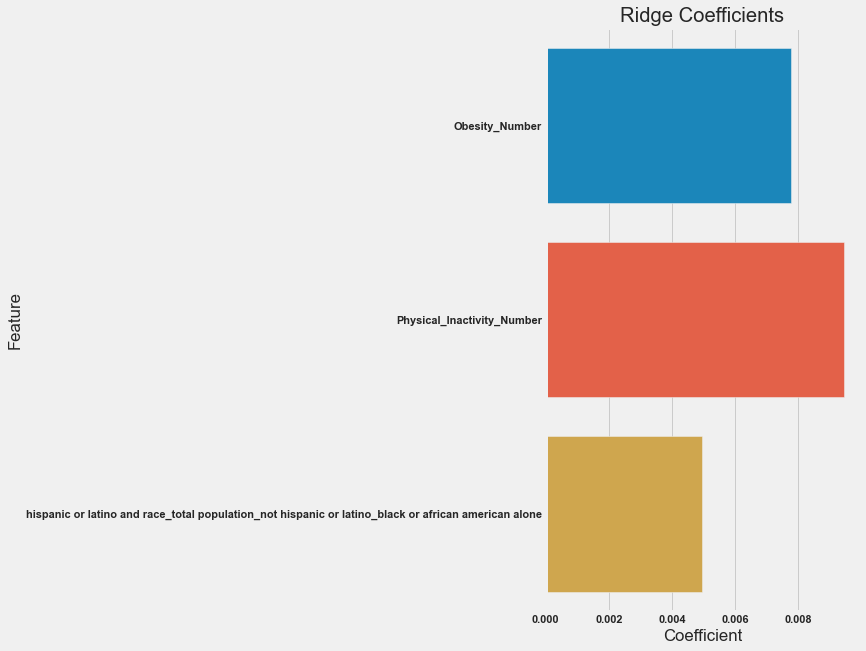

In [234]:
# Create a dataframe with the coefficient and feature names
ridge_reg_data = pd.DataFrame([ridge_reg.coef_, X_train.columns]).T
ridge_reg_data.columns = ['Coefficient', 'Feature']
# Plot
ax = sns.barplot(x="Coefficient", y="Feature", data=ridge_reg_data)
ax.set_title("Ridge Coefficients")
plt.show()

## (iii) LASSO Regression Model

In [235]:
##Determine hyperparameters to use
param_grid = {'normalize': ['True', 'False'],
             'fit_intercept': ['True', 'False'],
             'selection': ['cyclic', 'random'],
             }
lasso_grid_reg = GridSearchCV(Lasso(max_iter=10000), param_grid, cv=3, iid=False)
lasso_grid_reg.fit(X_train_scaled, y_train)

best_index = np.argmax(lasso_grid_reg.cv_results_["mean_test_score"])
print(lasso_grid_reg.cv_results_["params"][best_index])

{'fit_intercept': 'True', 'normalize': 'True', 'selection': 'cyclic'}


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:847: FutureWarning:

The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.



In [236]:
lasso_reg = Lasso(max_iter = 10000, alpha = .00000000001, fit_intercept = True, normalize = True, selection = 'cyclic').fit(X_train_scaled, y_train)
#need to hard-code very small alpha so coefficients appear
#lasso_reg = Lasso(**lasso_grid_reg.cv_results_["params"][best_index]).fit(X_train_scaled, y_train)


R^2 of Lasso Training Model: 0.42431355200326004
Correlation of Lasso Training Model 0.6513935461786984


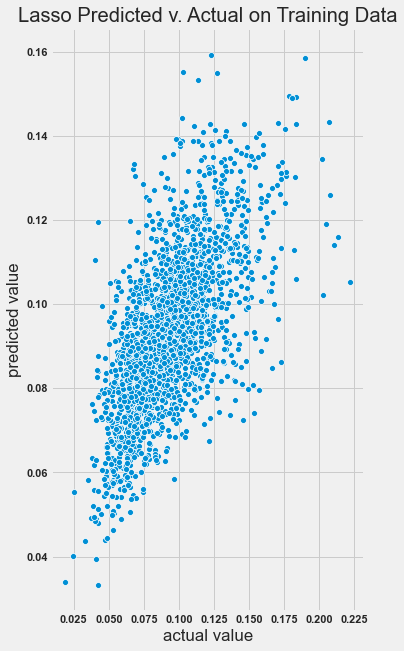

In [237]:
# Evaluate how well model fits the training data
lasso_y_hat_train = lasso_reg.predict(X_train_scaled)
lasso_r2_score = r2_score(y_train, lasso_y_hat_train)
print("R^2 of Lasso Training Model:", lasso_r2_score)
print("Correlation of Lasso Training Model", math.sqrt(lasso_r2_score))

sns.scatterplot(y_train, lasso_y_hat_train)
plt.title('Lasso Predicted v. Actual on Training Data')
plt.xlabel('actual value')
plt.ylabel('predicted value')
plt.show()

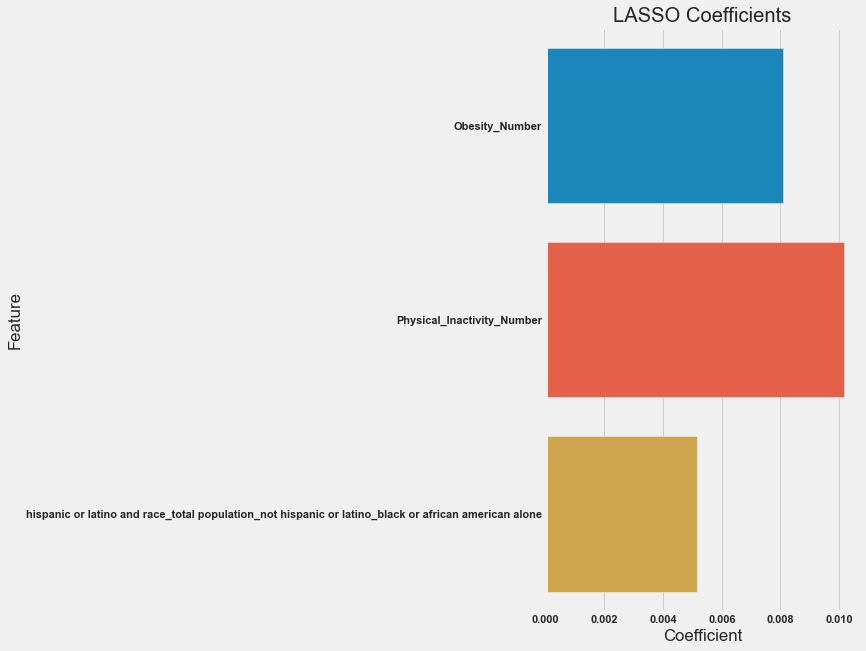

In [238]:
# Create a dataframe with the coefficient and feature names
lasso_reg_data = pd.DataFrame([lasso_reg.coef_, X_train.columns]).T
lasso_reg_data.columns = ['Coefficient', 'Feature']

# Plot
ax = sns.barplot(x="Coefficient", y="Feature", data=lasso_reg_data)
ax.set_title("LASSO Coefficients")
plt.show()

## (iv) Elastic-Net Model

In [239]:
#Determine hyperparameters to use
param_grid = {'alpha': np.arange(0.1,1.0,0.1),
             'l1_ratio': np.arange(0.0,1.0,.05),
             'fit_intercept': ['True', 'False'], 
             'normalize': ['True', 'False'],
             'selection': ['cyclic', 'random']}

enet = ElasticNet(max_iter=1000) 
import warnings # hide convergence warnings 
warnings.filterwarnings('ignore', category=ConvergenceWarning)
#I think it's would be better to keep the convergence warning, so that we know we have to increase max_iter when the method does not converge - VC
# ^ i agree it's safer to include them, but raising max_iter doesn't prevent the warning either and takes a WILD amount of time, so leaving for now until we figure out why - kq 
enet_grid_reg = GridSearchCV(enet, param_grid, scoring='r2', cv=3, iid=False)

enet_grid_reg.fit(X_train_scaled, y_train)

best_index = np.argmax(enet_grid_reg.cv_results_["mean_test_score"])

print(enet_grid_reg.cv_results_["params"][best_index])

{'alpha': 0.1, 'fit_intercept': 'True', 'l1_ratio': 0.0, 'normalize': 'True', 'selection': 'cyclic'}


/opt/anaconda3/lib/python3.8/site-packages/sklearn/model_selection/_search.py:847: FutureWarning:

The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.



In [240]:
#enet_reg = ElasticNet(l1_ratio = 0.0, alpha = 0.2, fit_intercept = True, normalize = False, selection = 'random').fit(X_train_scaled, y_train)
enet_reg = ElasticNet(**enet_grid_reg.cv_results_["params"][best_index]).fit(X_train_scaled, y_train)


R^2 of Elastic Net Training Model: 0.006781190933392023
Correlation of Elastic Net Training Model 0.08234798682051689


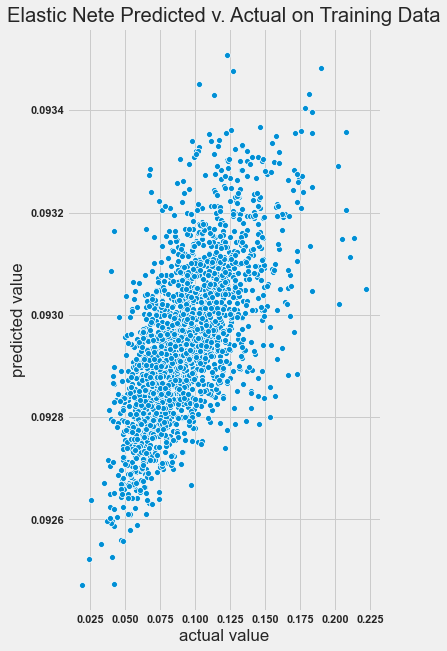

In [241]:
# Evaluate how well model fits the training data
enet_y_hat_train = enet_reg.predict(X_train_scaled)
enet_r2_score = r2_score(y_train, enet_y_hat_train)
print("R^2 of Elastic Net Training Model:", enet_r2_score)
print("Correlation of Elastic Net Training Model", math.sqrt(enet_r2_score))

sns.scatterplot(y_train, enet_y_hat_train)
plt.title('Elastic Nete Predicted v. Actual on Training Data')
plt.xlabel('actual value')
plt.ylabel('predicted value')
plt.show()

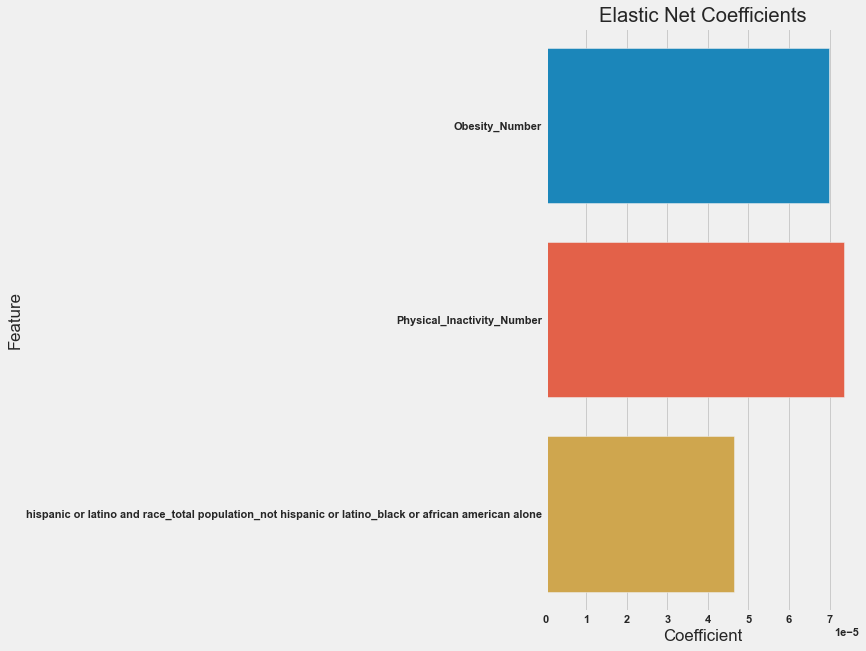

In [242]:
# Create a dataframe with the coefficient and feature names
enet_reg_data = pd.DataFrame([enet_reg.coef_, X_train.columns]).T
enet_reg_data.columns = ['Coefficient', 'Feature']

# Plot
ax = sns.barplot(x="Coefficient", y="Feature", data=enet_reg_data)
ax.set_title("Elastic Net Coefficients")
plt.show()

The hyperparameter tuning of the elastic net model yielded a L1 penalty of zero, which means this model is virtually identical to the ridge regression but with different hyperparameters. This is supported by the fact that the coefficients (and, by extension, MSEs) are quite similar in the two models. UPDATE: THEY CHANGED AFTER I WROTE THIS UP. NEED TO INVESTIGATE. - KQ 

## (v) Random Forest Model

In [243]:
# Number of trees in random forest - need to tune this a bit more still and use random numbers for the # levels and samples - kq 
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 100, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [2,40]
# Minimum number of samples required to split a node
min_samples_split = [2, 20]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1,20]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
param_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_grid_reg = GridSearchCV(rf,param_grid, cv = 3, n_jobs= -1, verbose = 2)
rf_grid_reg.fit(X_train_scaled, y_train)

best_index = np.argmax(rf_grid_reg.cv_results_["mean_test_score"])

print(rf_grid_reg.cv_results_["params"][best_index])




Fitting 3 folds for each of 320 candidates, totalling 960 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    6.8s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:   39.7s
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  1.0min


{'bootstrap': True, 'max_depth': 40, 'max_features': 'sqrt', 'min_samples_leaf': 20, 'min_samples_split': 2, 'n_estimators': 60}


[Parallel(n_jobs=-1)]: Done 960 out of 960 | elapsed:  1.8min finished


In [244]:
rf_reg = RandomForestRegressor(**rf_grid_reg.cv_results_["params"][best_index]).fit(X_train_scaled, y_train)

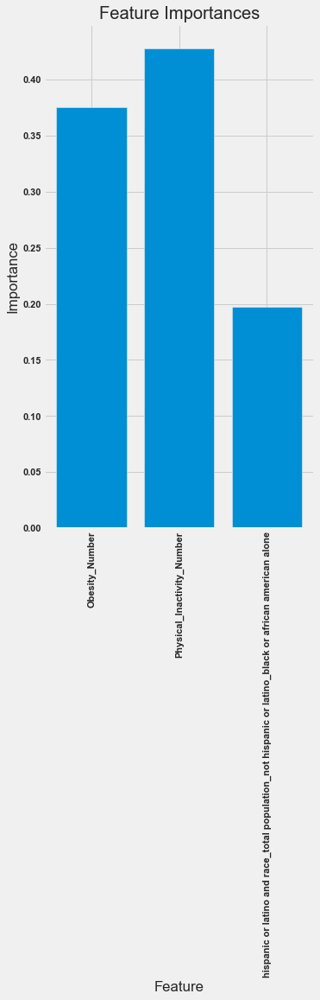

In [245]:
importances = list(rf_reg.feature_importances_)

# Set the style
plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(importances)))
# Make a bar chart
plt.bar(x_values, importances, orientation = 'vertical')
# Tick labels for x axis
plt.xticks(x_values, X_train.columns, rotation='vertical')
# Axis labels and title
plt.ylabel('Importance'); plt.xlabel('Feature'); plt.title('Feature Importances');

Random forest regression is well suited for... 

## 5. Validate and Refine Models

### 5.1. Predict on the Validation Set

Having fitted each model to the training data, we now predict on the validation set. 

In [246]:
#Predict each fitted model on the validation set

linear_y_hat = linear_reg.predict(X_valid_scaled)
ridge_y_hat = ridge_reg.predict(X_valid_scaled)
lasso_y_hat = lasso_reg.predict(X_valid_scaled)
enet_y_hat = enet_reg.predict(X_valid_scaled)
rf_y_hat = rf_reg.predict(X_valid_scaled)

### 5.2. Predicting on Test Set

We then compare the strength of the models by comparing the mean squared error of each model. We will select the model with the lowest mean squared error and predict that model on the test set.

In [247]:
#Calcualte and compare MSEs 

mse_linear = mean_squared_error(y_valid, linear_y_hat)
mse_ridge = mean_squared_error(y_valid, ridge_y_hat)
mse_lasso = mean_squared_error(y_valid, lasso_y_hat) 
mse_enet = mean_squared_error(y_valid, enet_y_hat)
mse_rf = mean_squared_error(y_valid, rf_y_hat) 
print('MSE OLS: ', mse_linear)
print('MSE ridge: ', mse_ridge)
print('MSE lasso: ', mse_lasso)
print('MSE elastic net: ', mse_enet) 
print('MSE random forest: ', mse_rf)
 

## @VC and KQ: It looks like OLS is the best?! -LL 

##Might be worth calculating accuracy scores as well? model.score 

MSE OLS:  0.0004110841437736228
MSE ridge:  0.00041201082266514215
MSE lasso:  0.00041108414650099285
MSE elastic net:  0.0007544966411171086
MSE random forest:  0.0004271249299890583


In [ ]:
## Select best-performing model and predict on the test set.

### 5.3. Cross Validation

In [248]:
#Perform 10-fold cross validation
scores = cross_val_score(linear_reg, features_scaled, target, cv =10)
print('Cross-validated scores:', scores)

##Was working off of this: https://towardsdatascience.com/train-test-split-and-cross-validation-in-python-80b61beca4b6
#Didn't get a chance to wrap up this part yet, but invite others to continue work on CV if you have time -LL


Cross-validated scores: [0.60756435 0.37439972 0.20964737 0.33594257 0.44148449 0.17874558
 0.38969948 0.40215141 0.38432465 0.45616175]


# 6. Discussion Questions

## 6.1. The bias-variance tradoff and its relevance to ML problems like this one
Bias-variance tradeoff is a general phenomenon in machine learning that models which have smaller training errors on average (low bias) will be more sensitive to small perturbations in training samples (high variance). Ideally, we want to find a predictor that fits data well (low bias) consistently across datasets (low variance). So bias-variance tradeoff serves as a reminder that when using more complicated models to achieve better training accuracy, we might be sacrificing generalizability along the way.

## 6.2. Overfitting, why it matters to ML, and ways to address it
Overfitting is the situation where a machine learning method has high accuracy in the training set, but perfoms poorly in the test set. It usually happens when people use more complicated models in an attempt to boost prediction accuracy, but the additional flexibility is used to fit noises rather than signals. The problem can be addressed by reserving part of the data as the validation set. First fit different models on the training set, and select models based on performance on the validation set. 

## 6.3. Discussion